In [4]:
import pandas as pd
import numpy as np

In [5]:
dfPertanyaan = pd.read_csv('dfPertanyaan.csv')

In [6]:
listTopik= dfPertanyaan['topik'].map(lambda x: x.replace('_','').strip()).unique().tolist()


In [7]:
# count all unique value in column topik
dfPertanyaan['topik'].value_counts().sort_values(ascending=False)

_PERUBAHAN JUDUL SKRIPSI FILKOM APPS                      182
_TOMBOL REVISI PROPOSAL SKRIPSI PADA FILKOM APPS          182
_PENDAFTARAN SEMINAR HASIL UJIAN SKRIPSI FILKOM UB         52
_TIDAK BISA MENGIKUTI PERKULIAHAN LURING HYBRID            36
FOTO YUDISIUM                                              33
VERIFIKASI SKM                                             32
_PROSES SERTIFIKASI IT BELUM ADA JAWABAN                   25
SURAT AKTIF KULIAH                                         25
TATA CARA PEMBAYARAN                                       22
LAYANAN                                                    20
TRANSKRIP LEGALISIR                                        20
PENGAMBILAN SERTIFIKAT TOEFL                               17
PENGAMBILAN KTM                                            16
PENGAJUAN BANTUAN                                          15
_KKN 2020                                                  11
ALUR GET NIM MAHASISWA FILKOM UB                            8
TIDAK BI

In [8]:
dfPertanyaanSeluruhnya = pd.DataFrame(
    columns=[
        'topik',
        'pertanyaan'
    ]
)

In [9]:
listTopik = dfPertanyaan['topik'].value_counts().index.tolist()

In [10]:
for topiks in listTopik:
    listPertanyaan = dfPertanyaan[dfPertanyaan['topik'] == topiks]['pertanyaan'].tolist()
    fullPertanyaan = ""
    for pertanyan in listPertanyaan:
        fullPertanyaan += pertanyan + " "

    topik = topiks.replace('_','').strip()
    pertanyaan = fullPertanyaan.replace('<br>','').replace('<p>','').replace('</p>','').replace('\xa0','')

    dfPertanyaanSeluruhnya = dfPertanyaanSeluruhnya.append(
        {
            'topik': topik,
            'pertanyaan': pertanyaan
        }
        , ignore_index=True
    )

C:\Users\AndiAlif\AppData\Local\Temp\ipykernel_6516\2568578118.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfPertanyaanSeluruhnya = dfPertanyaanSeluruhnya.append(
C:\Users\AndiAlif\AppData\Local\Temp\ipykernel_6516\2568578118.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfPertanyaanSeluruhnya = dfPertanyaanSeluruhnya.append(
C:\Users\AndiAlif\AppData\Local\Temp\ipykernel_6516\2568578118.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfPertanyaanSeluruhnya = dfPertanyaanSeluruhnya.append(
C:\Users\AndiAlif\AppData\Local\Temp\ipykernel_6516\2568578118.py:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dfPertanyaan

In [11]:
dfPertanyaanSeluruhnya.set_index('topik', inplace=True)

In [12]:
dfPertanyaanSeluruhnya

,pertanyaan
topik,
PERUBAHAN JUDUL SKRIPSI FILKOM APPS,Dengan ini mengajukan permohonan perbaikan men...
TOMBOL REVISI PROPOSAL SKRIPSI PADA FILKOM APPS,Dengan ini mengajukan permohonan perbaikan men...
PENDAFTARAN SEMINAR HASIL UJIAN SKRIPSI FILKOM UB,"Assalamu'alaikum, Selamat Pagi. Mohon maaf apa..."
TIDAK BISA MENGIKUTI PERKULIAHAN LURING HYBRID,KRS belum divalidasi sehingga tidak bisa mengi...
FOTO YUDISIUM,Assalamualaikum warahmatullahi wabarakatuh.<br...
VERIFIKASI SKM,tidak bisa login dengan akun UB untuk pengajua...
PROSES SERTIFIKASI IT BELUM ADA JAWABAN,"Selamat pagi, untuk permasalahan sisa dana bea..."
SURAT AKTIF KULIAH,Boleh pengajuan surat aktif kuliah saja jika t...
TATA CARA PEMBAYARAN,Selamat Pagi<br /><br />Apakah tata pembayaran...


In [16]:
from sklearn.feature_extraction.text import CountVectorizer
cv=CountVectorizer(analyzer='word')

data=cv.fit_transform(dfPertanyaanSeluruhnya.pertanyaan.to_list())
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index = dfPertanyaanSeluruhnya.index


c:\Users\AndiAlif\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


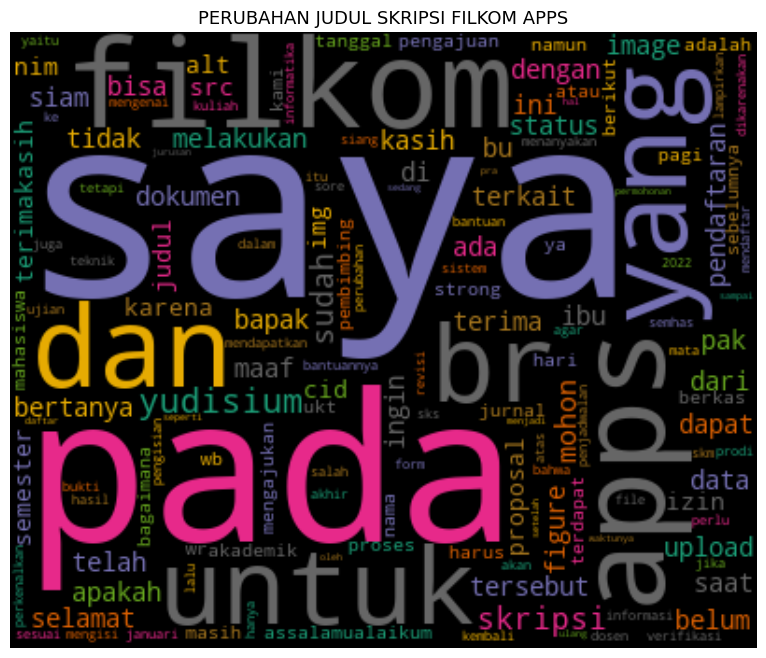

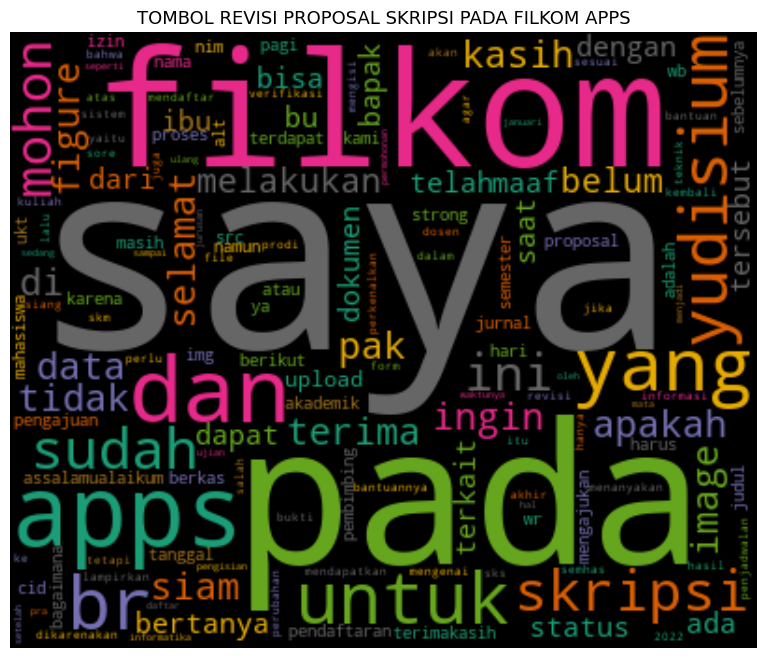

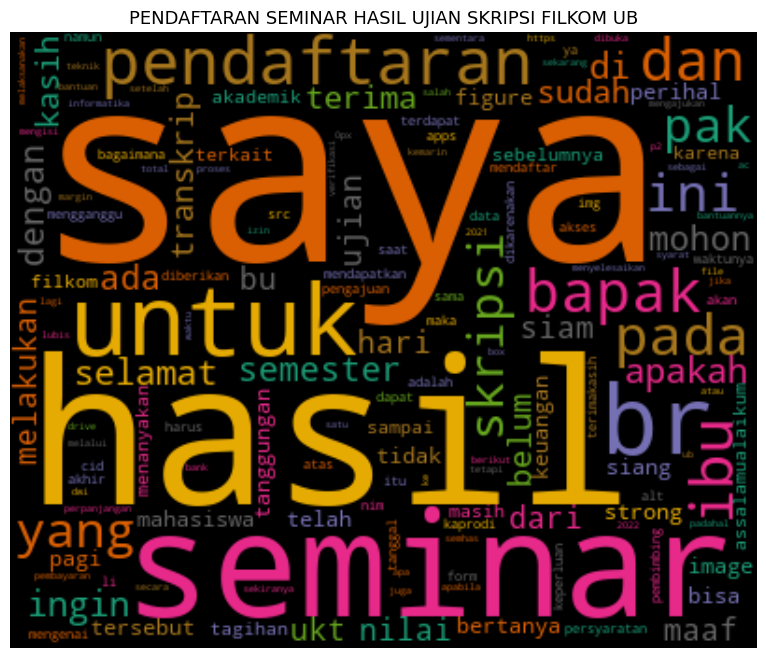

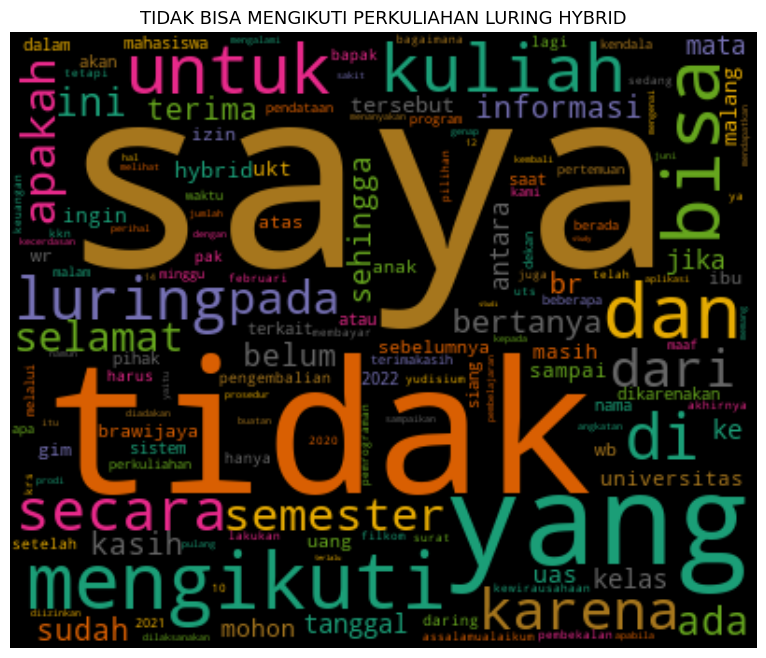

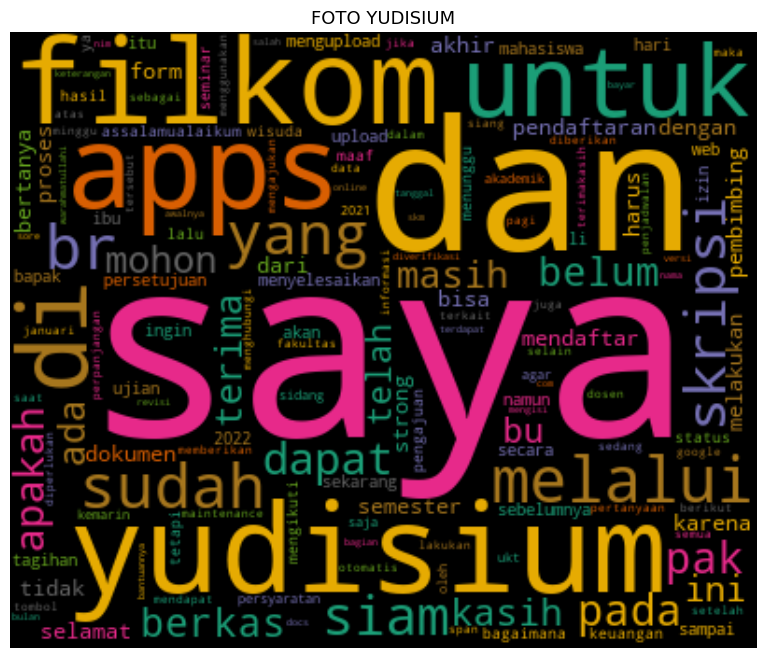

...

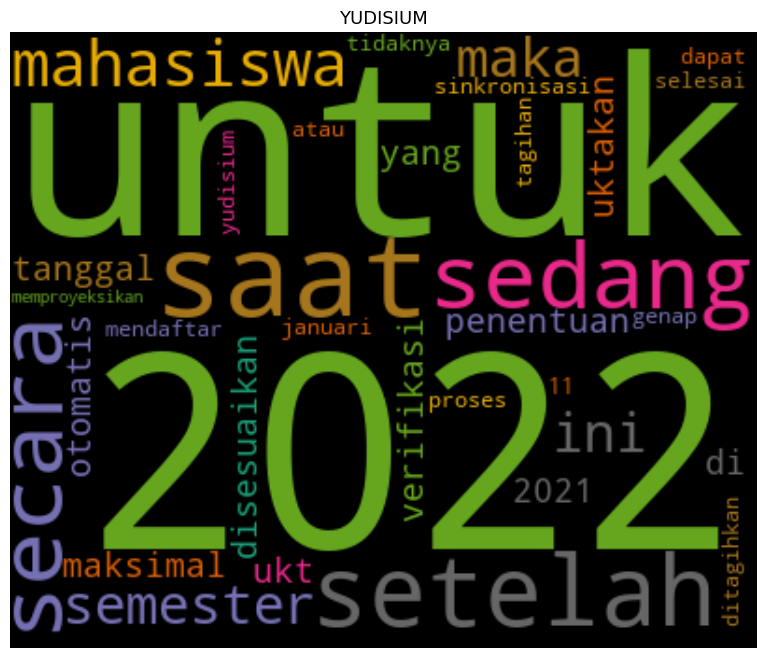

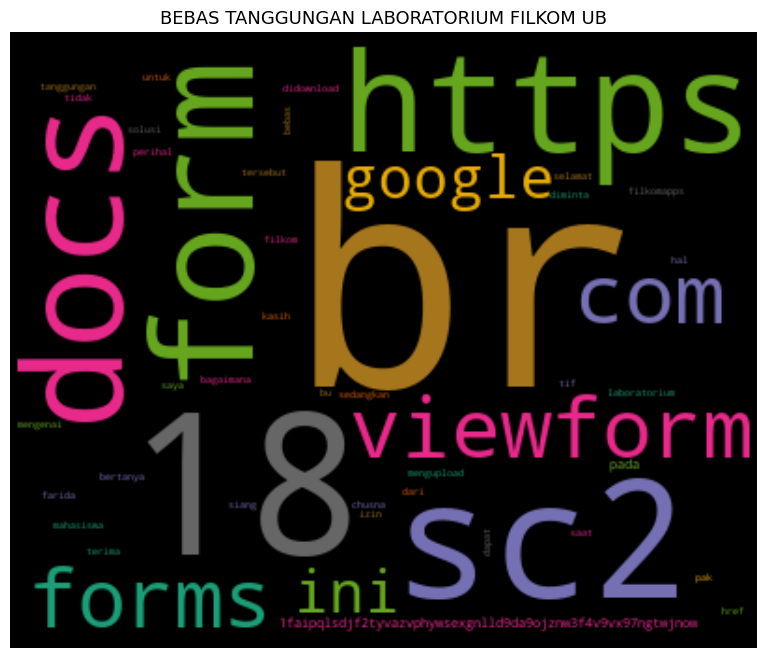

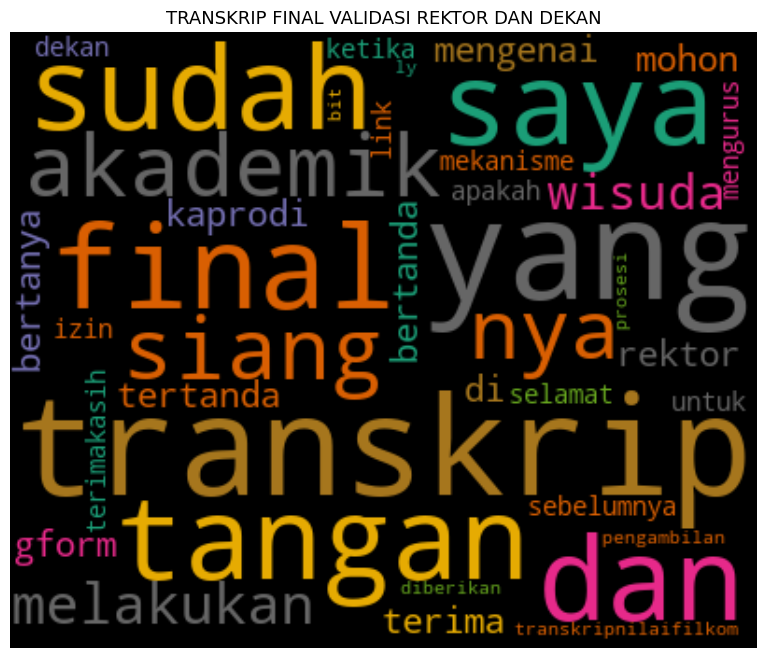

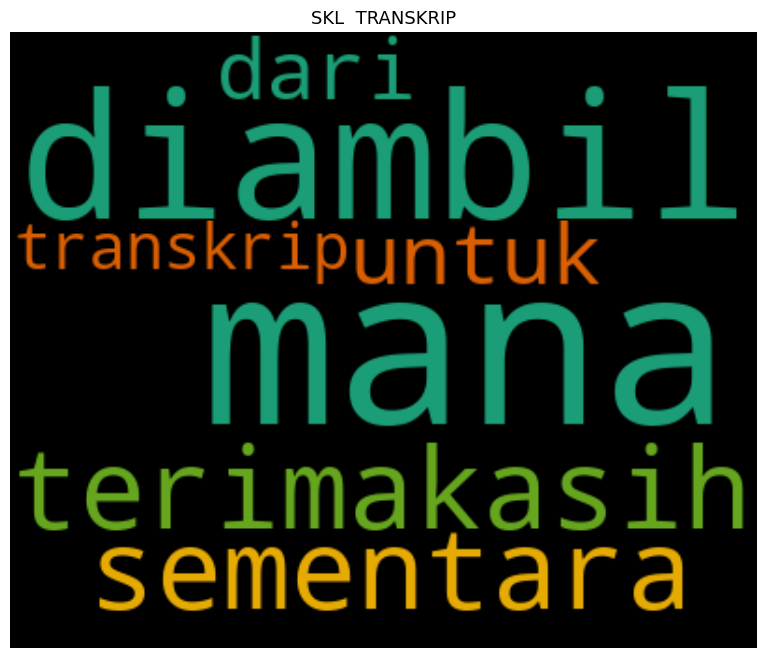

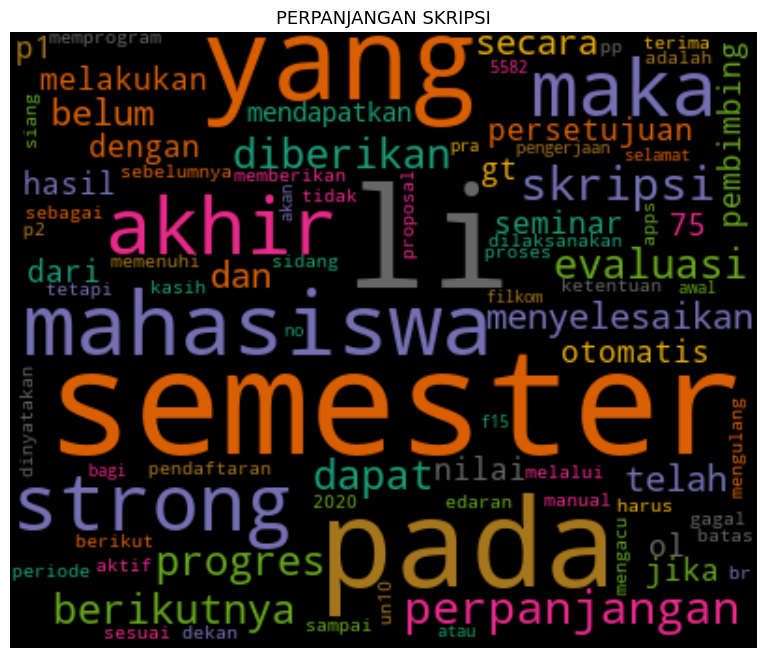

In [21]:
# Importing wordcloud for plotting word clouds and textwrap for wrapping longer text
from wordcloud import WordCloud
from textwrap import wrap
import matplotlib.pyplot as plt

# Function for generating word clouds
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate_from_frequencies(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()
  
# Transposing document term matrix
df_dtm = df_dtm.transpose()

# Plotting word cloud for each product
for index,product in enumerate(df_dtm.columns):
  
  generate_wordcloud(df_dtm[product].sort_values(ascending=False),product)